# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set(style="whitegrid")
import matplotlib.pyplot as plt
%matplotlib inline

import os
import glob as gb
import cv2
import tensorflow as tf
import keras

import warnings
warnings.filterwarnings('ignore')

# Explore Data

In [2]:
train_path ='../input/intel-image-classification/seg_train/'
test_path ='../input/intel-image-classification/seg_test/'
predict_path ='../input/intel-image-classification/seg_pred/'

In [3]:
for folder in  os.listdir(train_path + 'seg_train') : 
    files = gb.glob(pathname= str( train_path +'seg_train//' + folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 2512 in folder mountain
For training data , found 2382 in folder street
For training data , found 2191 in folder buildings
For training data , found 2274 in folder sea
For training data , found 2271 in folder forest
For training data , found 2404 in folder glacier


In [4]:
for folder in  os.listdir(test_path +'seg_test') : 
    files = gb.glob(pathname= str( test_path +'seg_test//' + folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 525 in folder mountain
For testing data , found 501 in folder street
For testing data , found 437 in folder buildings
For testing data , found 510 in folder sea
For testing data , found 474 in folder forest
For testing data , found 553 in folder glacier


In [5]:
files = gb.glob(pathname= str(predict_path +'seg_pred/*.jpg'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 7301


# Preprocessing

In [6]:
code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x   

In [7]:
size = []
for folder in  os.listdir(train_path +'seg_train') : 
    files = gb.glob(pathname= str( train_path +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(135, 150, 3)        3
(111, 150, 3)        3
(144, 150, 3)        2
(143, 150, 3)        2
(123, 150, 3)        2
(142, 150, 3)        2
(108, 150, 3)        2
(136, 150, 3)        2
(134, 150, 3)        2
(146, 150, 3)        2
(100, 150, 3)        1
(141, 150, 3)        1
(103, 150, 3)        1
(145, 150, 3)        1
(147, 150, 3)        1
(131, 150, 3)        1
(81, 150, 3)         1
(140, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(124, 150, 3)        1
(149, 150, 3)        1
(110, 150, 3)        1
(105, 150, 3)        1
(97, 150, 3)         1
(120, 150, 3)        1
(76, 150, 3)         1
(119, 150, 3)        1
(102, 150, 3)        1
Name: count, dtype: int64

In [8]:
size = []
for folder in  os.listdir(test_path +'seg_test') : 
    files = gb.glob(pathname= str( test_path +'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(81, 150, 3)        1
(131, 150, 3)       1
(141, 150, 3)       1
(149, 150, 3)       1
(110, 150, 3)       1
(76, 150, 3)        1
(72, 150, 3)        1
Name: count, dtype: int64

In [9]:
size = []
files = gb.glob(pathname= str(predict_path +'seg_pred/*.jpg'))
for file in files: 
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(139, 150, 3)       1
(108, 150, 3)       1
(129, 150, 3)       1
(143, 150, 3)       1
(149, 150, 3)       1
(144, 150, 3)       1
(133, 150, 3)       1
(112, 150, 3)       1
(100, 150, 3)       1
(374, 500, 3)       1
(126, 150, 3)       1
(124, 150, 3)       1
(131, 150, 3)       1
Name: count, dtype: int64

In [10]:
s = 100

In [11]:
x_train = []
y_train = []
for folder in  os.listdir(train_path +'seg_train') : 
    files = gb.glob(pathname= str( train_path +'seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        x_train.append(list(image_array))
        y_train.append(code[folder])

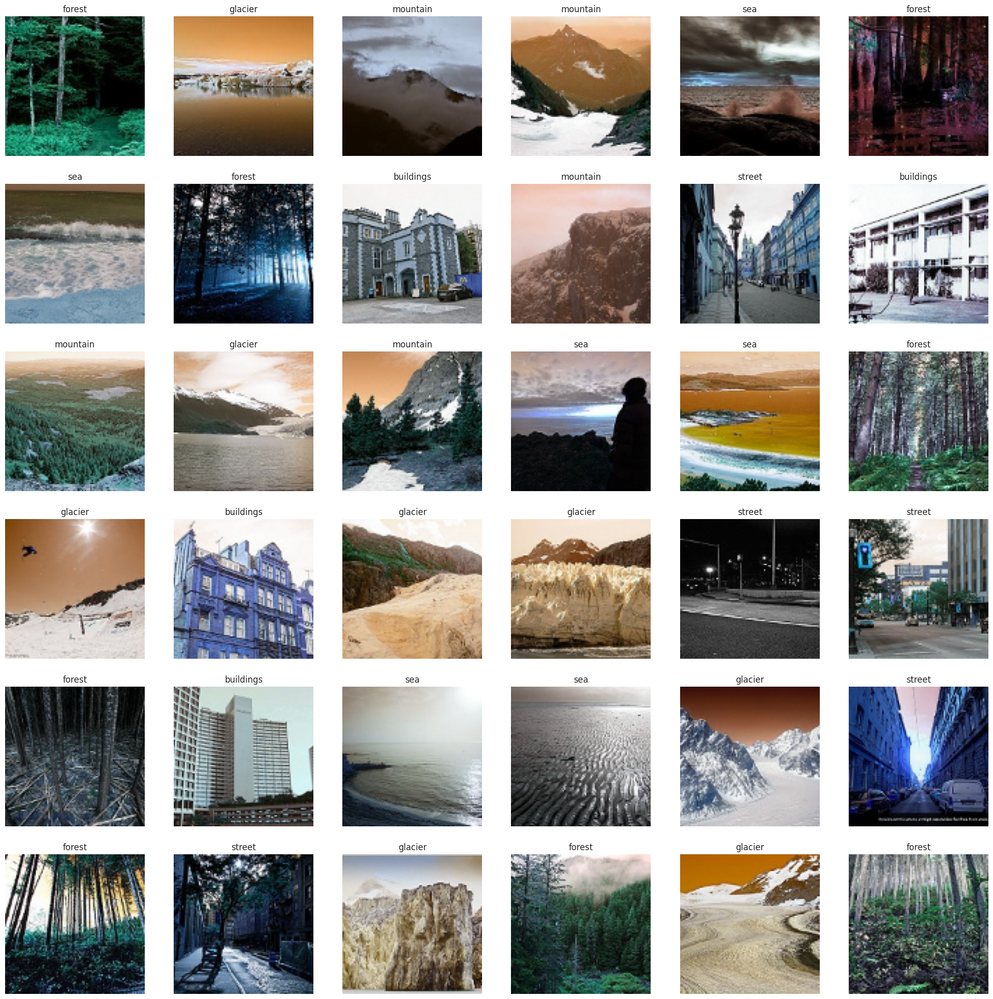

In [12]:
plt.figure(figsize=(25,25))
for n , i in enumerate(list(np.random.randint(0,len(x_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [13]:
x_test = []
y_test = []
for folder in  os.listdir(test_path +'seg_test') : 
    files = gb.glob(pathname= str(test_path + 'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        x_test.append(list(image_array))
        y_test.append(code[folder])

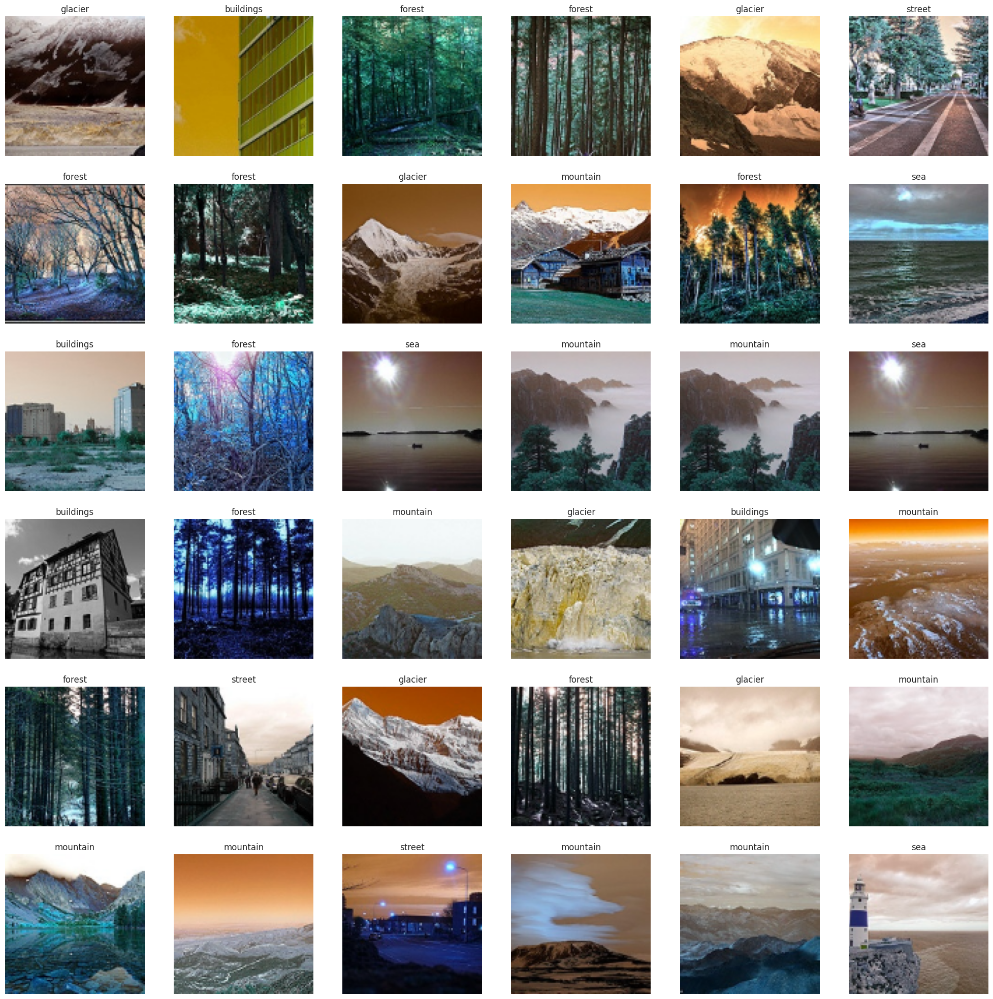

In [14]:
plt.figure(figsize=(25,25))
for n , i in enumerate(list(np.random.randint(0,len(x_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_test[i])    
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [15]:
x_pred = []
files = gb.glob(pathname= str(predict_path + 'seg_pred/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    x_pred.append(list(image_array))       

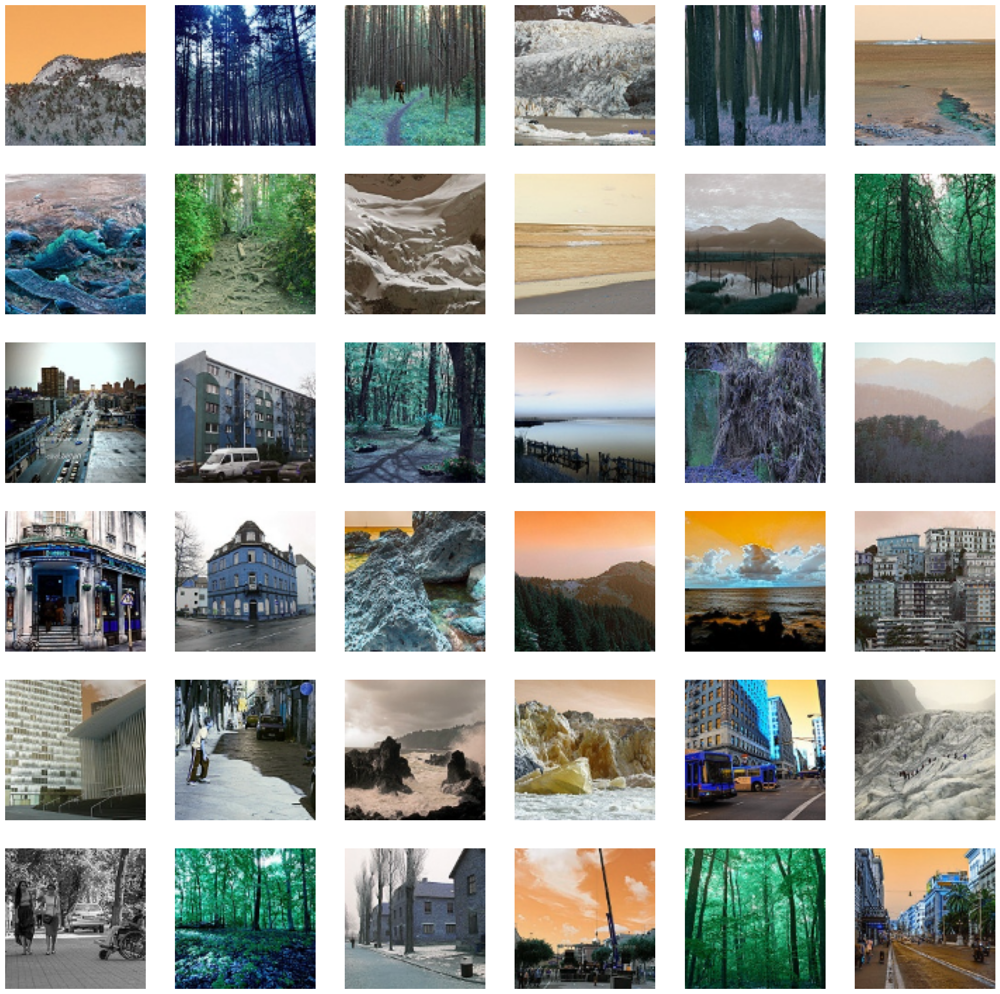

In [16]:
plt.figure(figsize=(25,25))
for n , i in enumerate(list(np.random.randint(0,len(x_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])    
    plt.axis('off')

# Build Model

In [17]:
x_train = np.array(x_train)
x_test = np.array(x_test)
x_pred_array = np.array(x_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {x_train.shape}')
print(f'X_test shape  is {x_test.shape}')
print(f'X_pred shape  is {x_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


In [18]:
KerasModel = keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(s,s,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten() ,    
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,    
        keras.layers.Dense(50,activation='relu') ,        
        keras.layers.Dropout(rate=0.5) ,            
        keras.layers.Dense(6,activation='softmax') ,    
        ])

In [19]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [20]:
print(KerasModel.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 200)    │         5,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 96, 96, 150)    │       270,150 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 150)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 22, 22, 120)    │       162,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 20, 20, 80)     │        86,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 18, 18, 50)     │        36,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 4, 4, 50)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 800)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │        96,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        12,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 673,976 (2.57 MB)

 Trainable params: 673,976 (2.57 MB)

 Non-trainable params: 0 (0.00 B)

None


In [21]:
ThisModel = KerasModel.fit(x_train, y_train, epochs=40,batch_size=64,verbose=1)

Epoch 1/40


I0000 00:00:1726335528.119920      71 service.cc:145] XLA service 0x7d1ce0013fa0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1726335528.119982      71 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
2024-09-14 17:39:00.372465: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[150,200,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,200,98,98]{3,2,1,0}, f32[64,150,96,96]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-09-14 17:39:05.468577: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 6.09625982s
Trying algorithm eng0{} for conv (f32[150,200

  2/220 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - accuracy: 0.1562 - loss: 8.0464   

I0000 00:00:1726335549.196706      71 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


219/220 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.1718 - loss: 2.2929

2024-09-14 17:39:33.688959: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[150,200,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[18,200,98,98]{3,2,1,0}, f32[18,150,96,96]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-09-14 17:39:34.405023: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.716159836s
Trying algorithm eng0{} for conv (f32[150,200,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[18,200,98,98]{3,2,1,0}, f32[18,150,96,96]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv

220/220 ━━━━━━━━━━━━━━━━━━━━ 55s 142ms/step - accuracy: 0.1718 - loss: 2.2893
Epoch 2/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.2055 - loss: 1.7516
Epoch 3/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.5078 - loss: 1.2769
Epoch 4/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.6117 - loss: 1.0108
Epoch 5/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.6619 - loss: 0.8963
Epoch 6/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.7144 - loss: 0.7972
Epoch 7/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.7420 - loss: 0.7313
Epoch 8/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.7582 - loss: 0.7003
Epoch 9/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.7719 - loss: 0.6508
Epoch 10/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.7850 - loss: 0.6135
Epoch 11/40
220/220 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8180 - loss: 0.5291
Epoch 12/40
220/220 ━━━━━━━━━━━━━━━━━━━━

In [22]:
KerasModel.evaluate(x_test, y_test)

94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - accuracy: 0.7708 - loss: 1.3002


[1.2342588901519775, 0.7776666879653931]

In [23]:
KerasModel.predict(x_test)

94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step


array([[1.5176358e-02, 4.3994528e-03, 1.3154238e-01, 3.9239129e-01,
        4.5335367e-01, 3.1368542e-03],
       [1.4533316e-06, 4.3964756e-05, 1.0582510e-01, 8.8196039e-01,
        1.2169016e-02, 2.5532916e-07],
       [2.3807768e-02, 2.9163959e-04, 1.7139547e-03, 9.6656001e-01,
        7.1365731e-03, 4.8999436e-04],
       ...,
       [6.9025309e-06, 2.1985215e-06, 6.8202674e-02, 8.8027680e-01,
        5.1511154e-02, 3.6179713e-07],
       [4.0286801e-14, 1.8756033e-16, 3.4744210e-06, 9.9999416e-01,
        2.3837274e-06, 7.4002324e-17],
       [3.1476439e-15, 1.4796974e-20, 9.9990666e-01, 9.3256931e-05,
        1.3952970e-07, 7.3218633e-17]], dtype=float32)

In [24]:
y_result=KerasModel.predict(x_pred_array)

229/229 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step


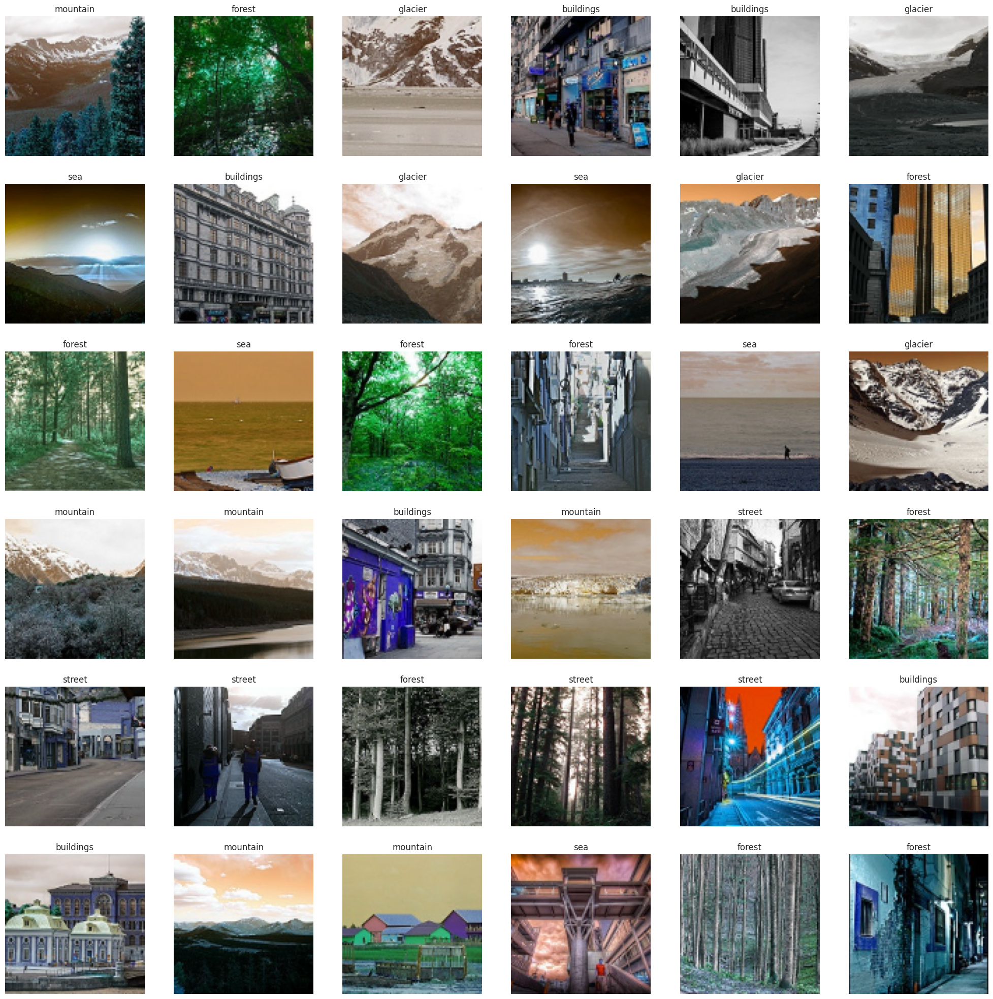

In [25]:
plt.figure(figsize=(25,25))
for n , i in enumerate(list(np.random.randint(0,len(x_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))